# Goal: generate protocol to get up to 5 different env per task

In [5]:
# Extract from https://github.com/StanfordVL/behavior/blob/main/behavior/benchmark/behavior_benchmark.py
import os
import json
import numpy as np

from PIL import Image
from igibson.utils.utils import parse_config

from igibson import object_states
from igibson.utils.utils import restoreState

from igibson.action_primitives.fetch_robot_semantic_actions_env import FetchRobotSemanticActionEnv
from igibson.custom_utils import get_env_config, print_properties, get_variations_list
from igibson.primitives_utils import get_names_of_visible_obj_inside, get_objects_inside, settle_physics
import igibson.render_utils as render_utils

import warnings
warnings.filterwarnings("ignore")

In [6]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Generate metadata for each split

NOTE: this stuff needs to be moved on the other repo

In [7]:
easy_filename = 'easy_split_metadata.json'

easy_split_metadata = {
    #"bringing_in_wood_easy.pddl": { # to be debugged
    #    "activity_name": "bringing_in_wood"
    #},
    "cleaning_out_drawers_easy.pddl": {
        "activity_name": "cleaning_out_drawers"
    },
    "locking_every_door.pddl": {
        "activity_name": "locking_every_door"
    },
    "locking_every_window_easy.pddl": {
        "activity_name": "locking_every_window"
    },
    #"opening_packages.pddl": { # to be debugged
    #    "activity_name": "opening_packages"
    #},
    #"opening_presents.pddl": { # to be debugged
    #    "activity_name": "opening_presents"
    #},
    "packing_food_for_work_easy.pddl": {
        "activity_name": "packing_food_for_work"
    }
}

for entry in easy_split_metadata:
    task = easy_split_metadata[entry]["activity_name"]
    easy_split_metadata[entry]["scene_instance_pairs"] = get_variations_list(task)
    
with open(easy_filename, 'w') as f:
    json.dump(easy_split_metadata, f, indent=4)

### Example with known environment

Scene_id: Benevolence_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


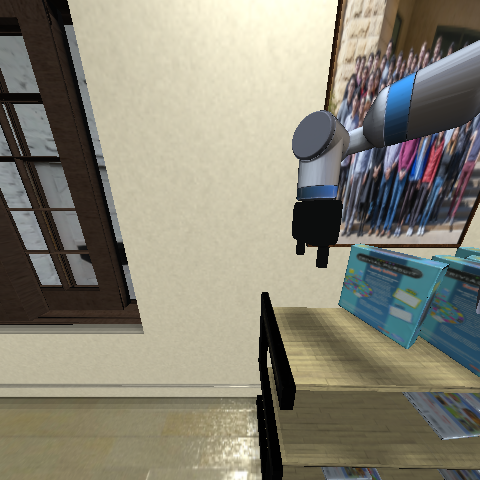

Scene_id: Benevolence_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: oven_24 has joint that cannot extend for >66%.
Robot's cached initial pose has collisions.


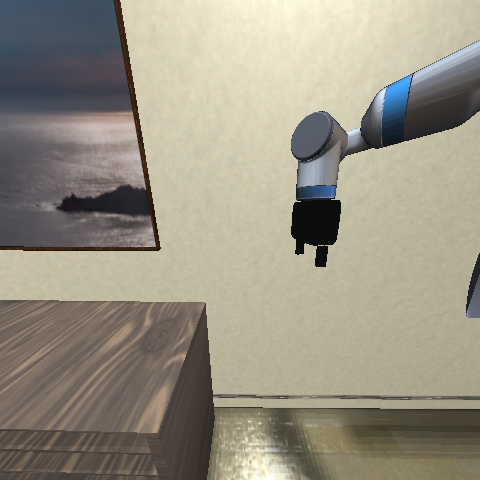

Scene_id: Pomaria_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: washer_56 has joint that cannot extend for >66%.


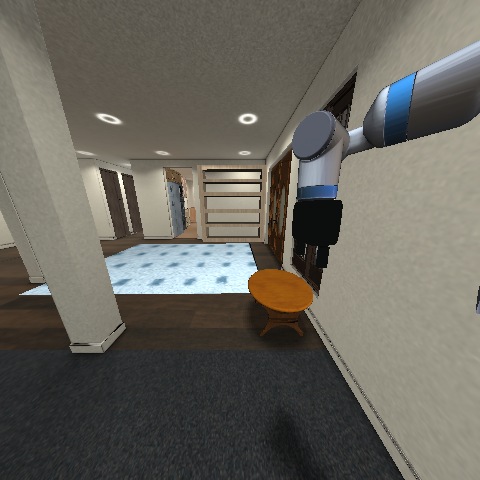

Scene_id: Pomaria_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: washer_56 has joint that cannot extend for >66%.
scene quality check: window_68 has joint that cannot extend for >66%.


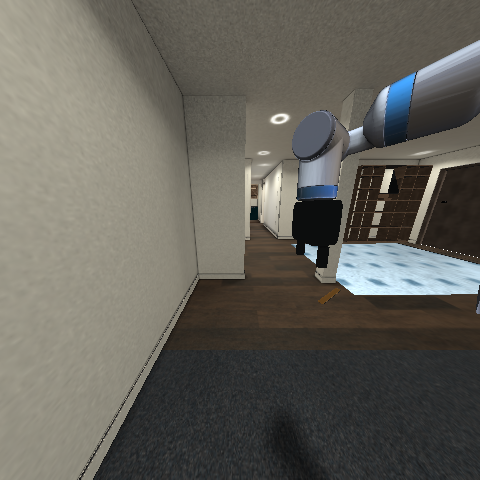

Scene_id: Wainscott_0_int - instance_id: 0
Rendering settings is None - going with the default settings!


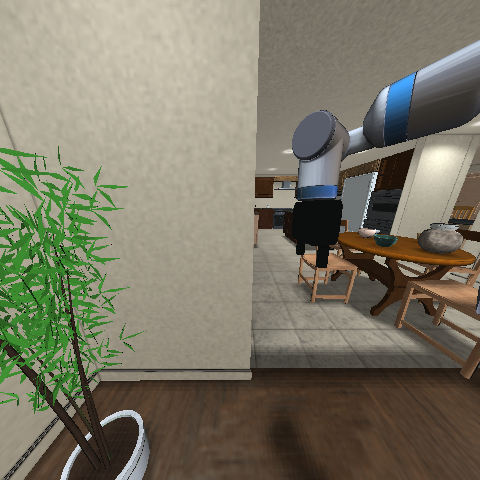

Scene_id: Benevolence_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


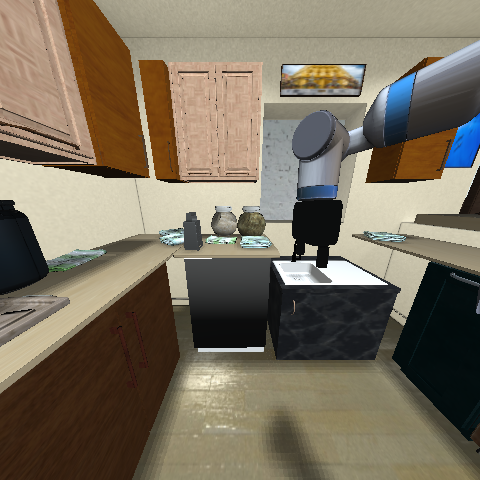

Scene_id: Benevolence_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: oven_24 has joint that cannot extend for >66%.


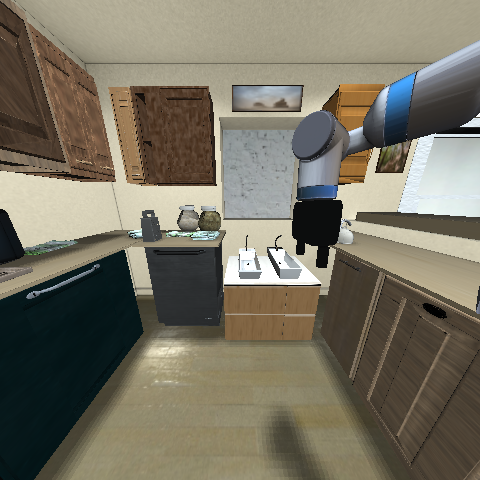

Scene_id: Pomaria_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: washer_56 has joint that cannot extend for >66%.


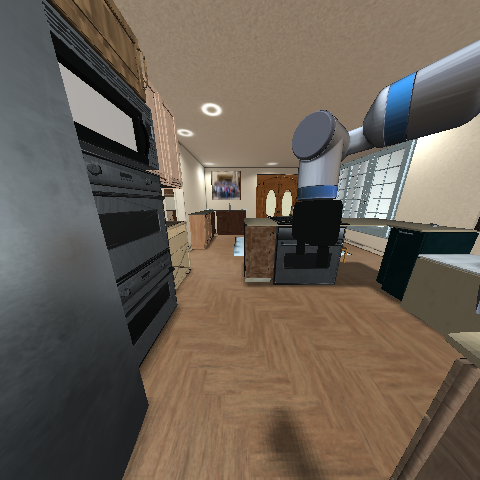

Scene_id: Pomaria_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: washer_56 has joint that cannot extend for >66%.
scene quality check: window_68 has joint that cannot extend for >66%.
Robot's cached initial pose has collisions.


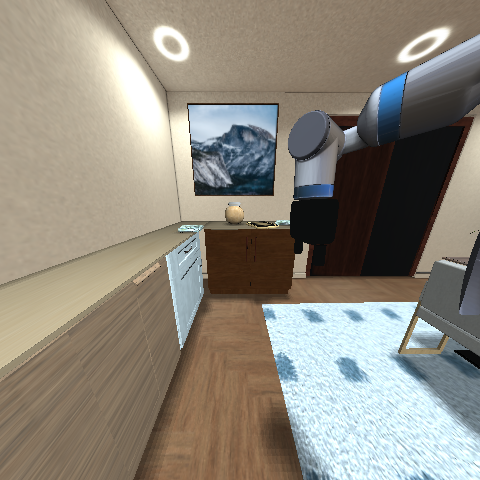

Scene_id: Rs_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_41 has joint that cannot extend for >66%.


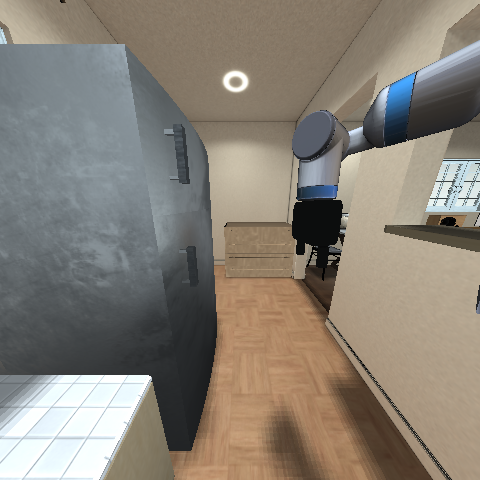

Scene_id: Merom_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_2 has joint that cannot extend for >66%.


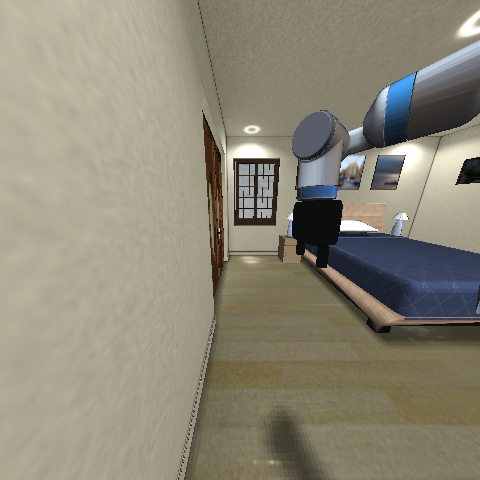

Scene_id: Merom_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_2 has joint that cannot extend for >66%.
scene quality check: bottom_cabinet_30 has joint that cannot extend for >66%.
scene quality check: bottom_cabinet_50 has joint that cannot extend for >66%.
scene quality check: door_88 has joint that cannot extend for >66%.


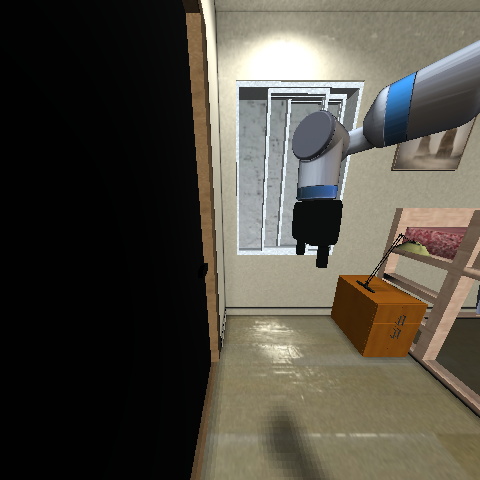

Scene_id: Pomaria_0_int - instance_id: 0
Rendering settings is None - going with the default settings!


Robot's cached initial pose has collisions.


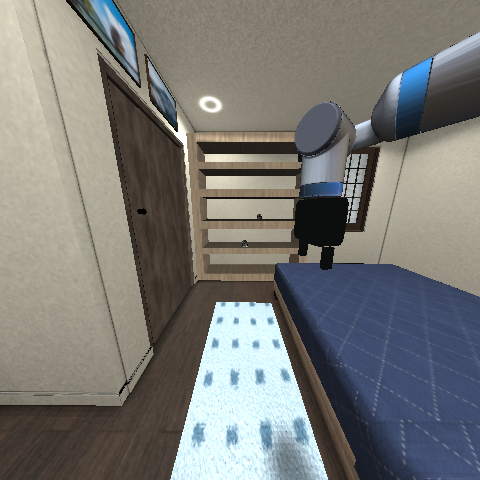

Scene_id: Pomaria_0_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: folding_chair_18 has joint that cannot extend for >66%.


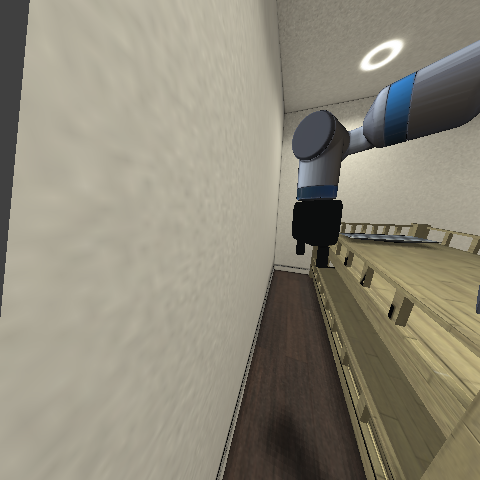

Scene_id: Wainscott_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_34 has joint that cannot extend for >66%.


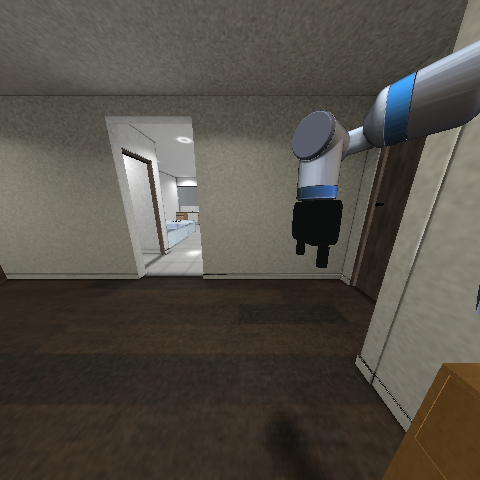

Scene_id: Merom_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_2 has joint that cannot extend for >66%.


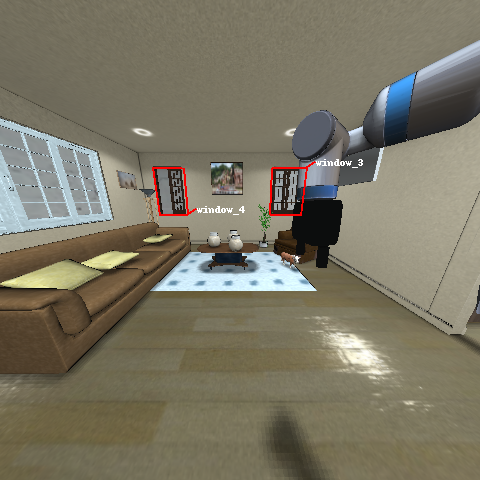

Scene_id: Merom_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_2 has joint that cannot extend for >66%.
scene quality check: bottom_cabinet_30 has joint that cannot extend for >66%.
scene quality check: bottom_cabinet_50 has joint that cannot extend for >66%.
scene quality check: door_88 has joint that cannot extend for >66%.


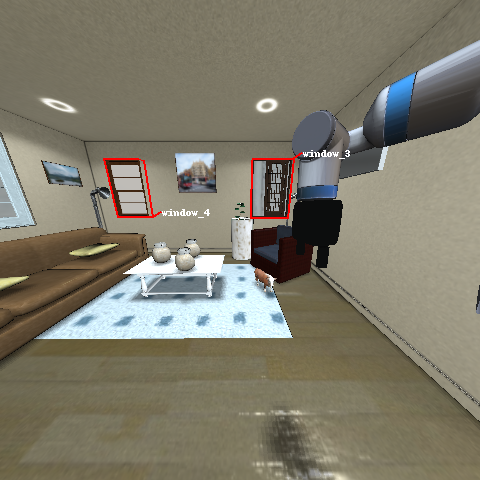

Scene_id: Rs_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_41 has joint that cannot extend for >66%.


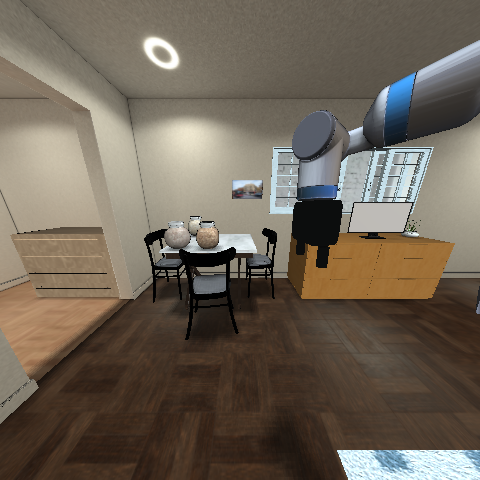

Scene_id: Rs_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: top_cabinet_49 has joint that cannot extend for >66%.


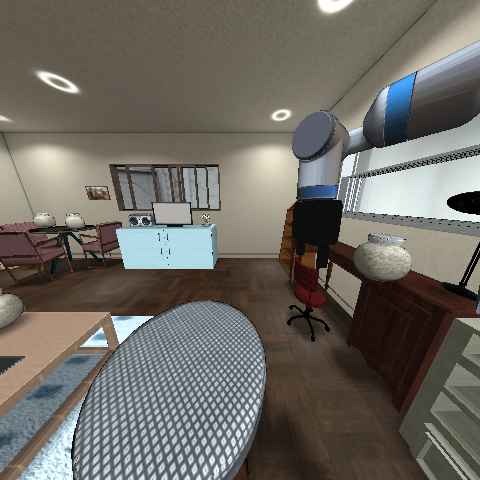

Scene_id: Wainscott_0_int - instance_id: 0
Rendering settings is None - going with the default settings!


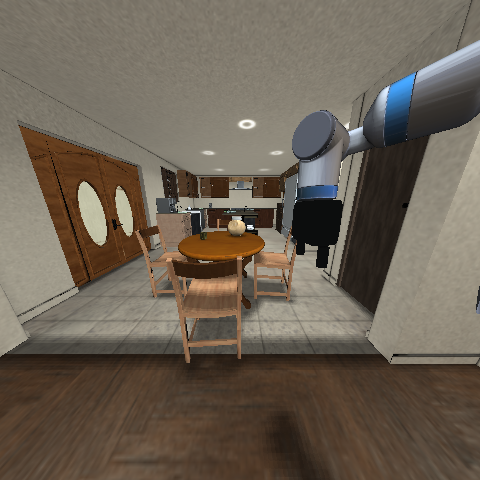

Scene_id: Benevolence_2_int - instance_id: 0
Rendering settings is None - going with the default settings!


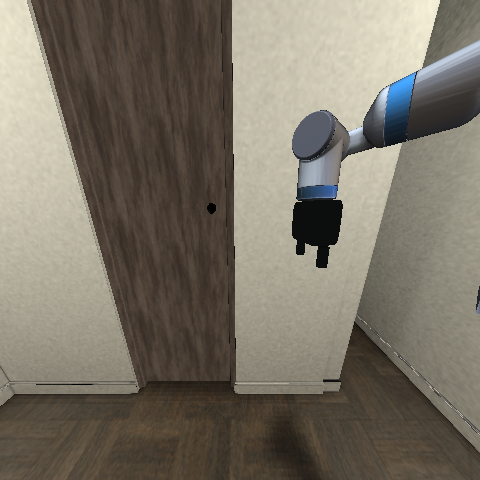

Scene_id: Benevolence_2_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_4 has joint that cannot extend for >66%.
scene quality check: door_37 has joint that cannot extend for >66%.


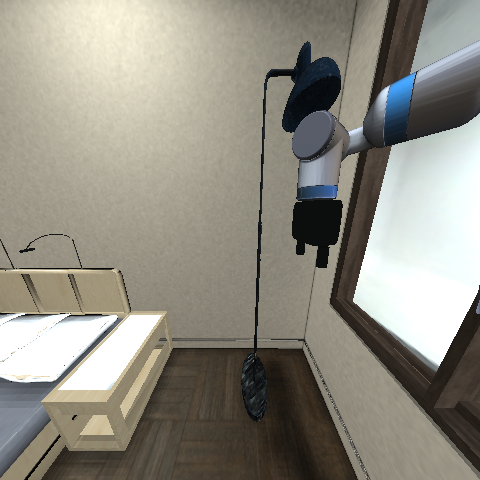

Scene_id: Pomaria_2_int - instance_id: 0
Rendering settings is None - going with the default settings!


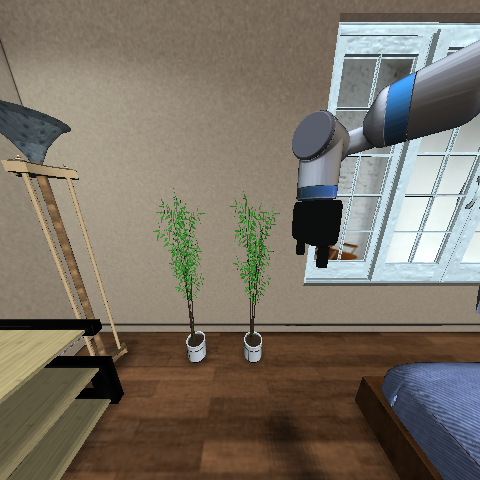

Scene_id: Pomaria_2_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: window_28 has joint that cannot extend for >66%.


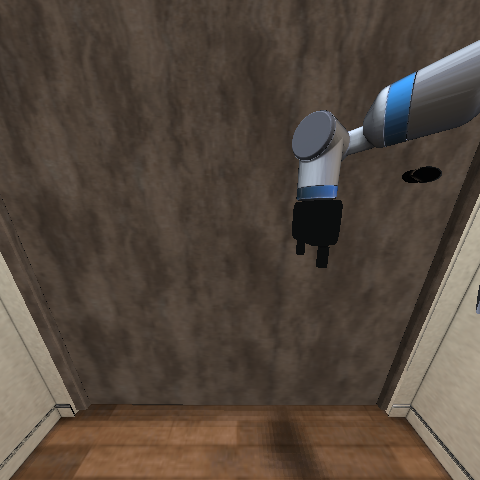

Scene_id: Wainscott_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_34 has joint that cannot extend for >66%.


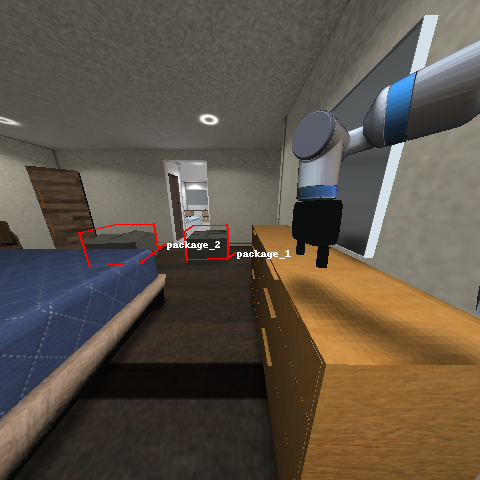

Scene_id: Benevolence_2_int - instance_id: 0
Rendering settings is None - going with the default settings!


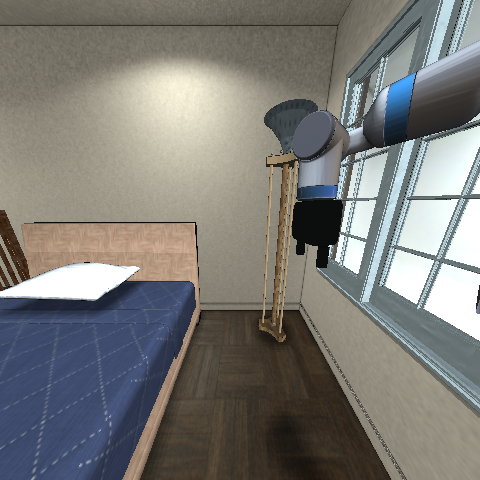

Scene_id: Benevolence_2_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_4 has joint that cannot extend for >66%.
scene quality check: door_37 has joint that cannot extend for >66%.


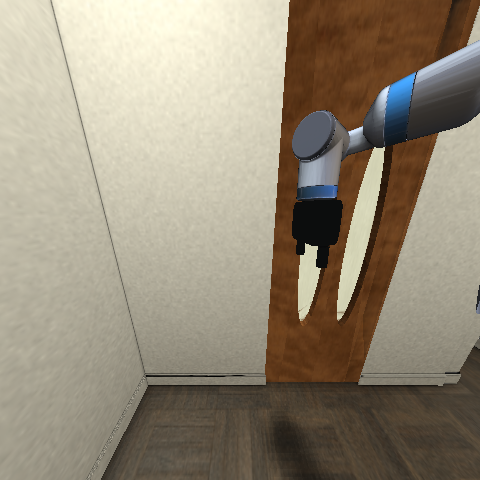

Scene_id: Pomaria_2_int - instance_id: 0
Rendering settings is None - going with the default settings!


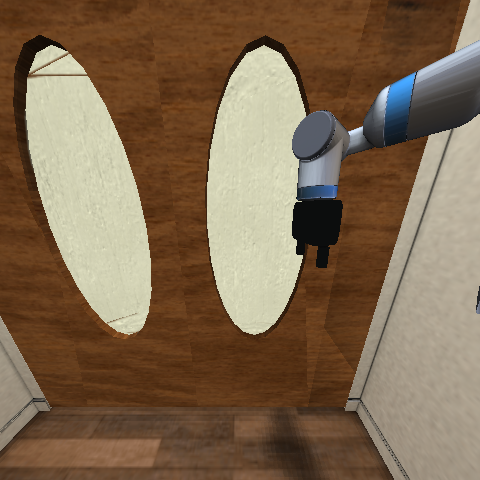

Scene_id: Pomaria_2_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: window_28 has joint that cannot extend for >66%.
Robot's cached initial pose has collisions.


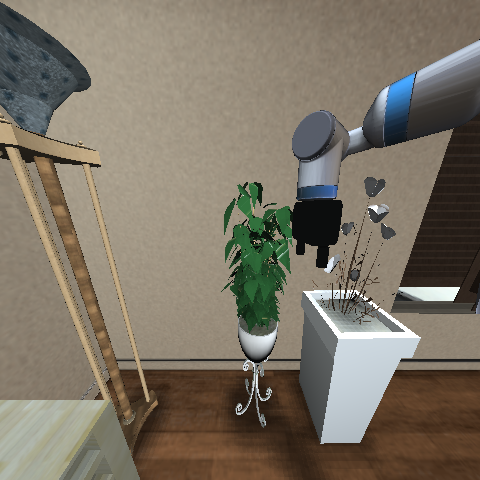

Scene_id: Wainscott_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_34 has joint that cannot extend for >66%.


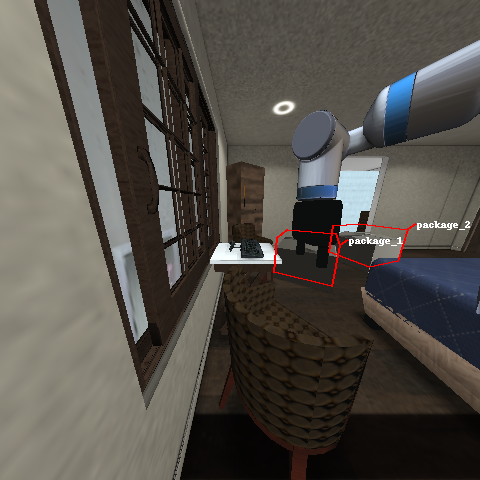

Scene_id: Beechwood_0_int - instance_id: 0
Rendering settings is None - going with the default settings!


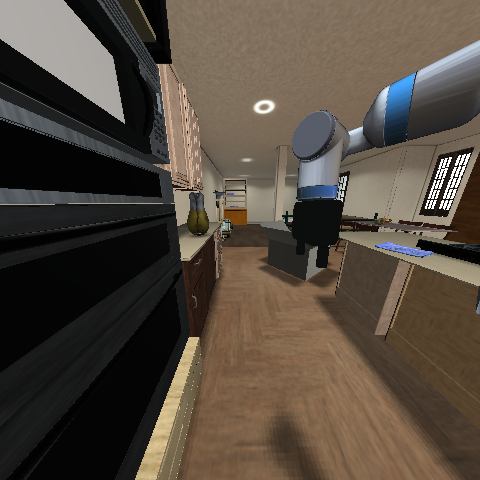

Scene_id: Beechwood_0_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: bottom_cabinet_15 has joint that cannot extend for >66%.
scene quality check: desk_41 has joint that cannot extend for >66%.


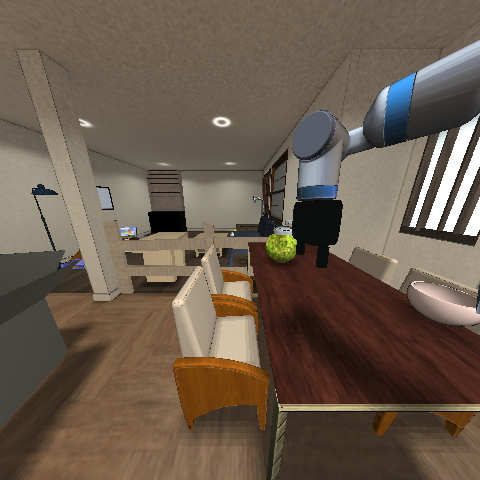

Scene_id: Ihlen_1_int - instance_id: 0
Rendering settings is None - going with the default settings!


scene quality check: toilet_47 has joint that cannot extend for >66%.


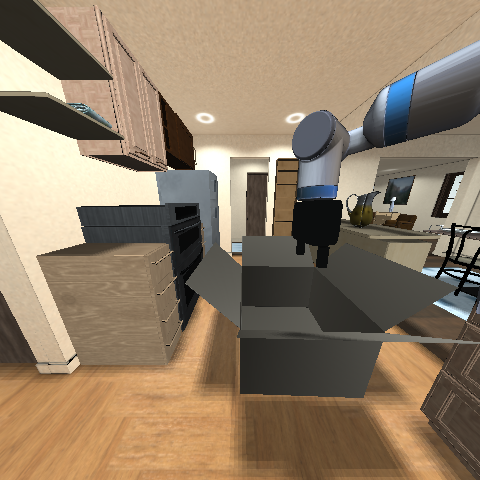

Scene_id: Ihlen_1_int - instance_id: 20
Rendering settings is None - going with the default settings!


scene quality check: toilet_47 has joint that cannot extend for >66%.
scene quality check: bottom_cabinet_no_top_75 has joint that cannot extend for >66%.


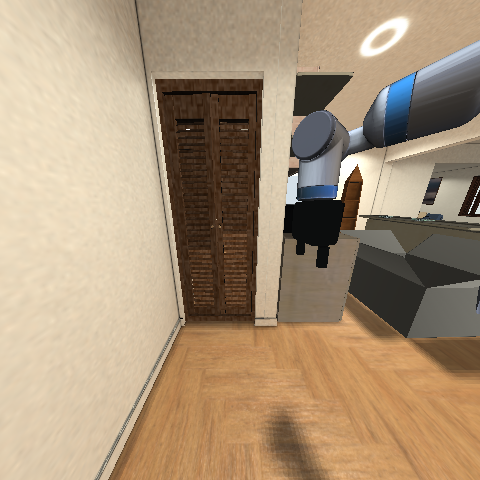

Scene_id: Wainscott_0_int - instance_id: 0
Rendering settings is None - going with the default settings!


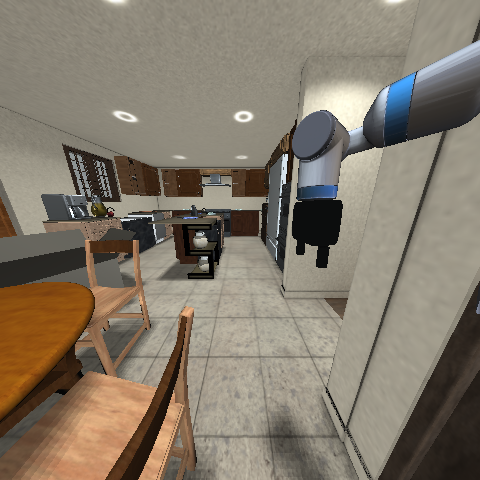

In [7]:
for entry in easy_split_metadata:
    task = easy_split_metadata[entry]["activity_name"]
    for scene_id, instance_id in easy_split_metadata[entry]["scene_instance_pairs"]:
        print(f"Scene_id: {scene_id} - instance_id: {instance_id}")

        # Init env
        sim_env = FetchRobotSemanticActionEnv(task, scene_id, instance_id, verbose=False)
        
        # Get initial state and show it
        image, symbolic_state = sim_env.get_state_and_image()
        image.show()

        # Here goes the planning logic / benchmarking part
        # ...
        
        # Shut down gracefully to avoid memory leaks
        sim_env.env.clean()

### Old code available

In [ ]:
# Factors of variation: scenes available, 

In [ ]:
for activity in activities:
    assert activity in activity_to_scenes.keys()
    scenes = sorted(set(activity_to_scenes[activity]))  # Get the scenes where the activity can be performed
    num_scenes = len(scenes)
    assert num_scenes <= 3

    # Official benchmark: Evaluate 9 episodes per activity
    # instance id 0-9: seen poses
    # instance id 10-19: unseen poses
    # instance id 20-29: unseen scenes (same houses but different furniture arrangement)
    # If you don't have enough activity instances in ig_dataset, the behavior data bundle is outdated.
    # You need to follow the participant guide and download again.

    # Depending on the number of scenes available for this activity
    if num_scenes == 3:
        # Regular case. We use three instances per scene (one "seen poses", one "unseen poses" and one
        # "unseen scene" (different furniture))
        scene_instance_ids = {
            scenes[0]: [0, 10, 20],
            scenes[1]: [0, 10, 20],
            scenes[2]: [0, 10, 20],
        }
    elif num_scenes == 2:
        # We use four instances of one scene (two "seen poses", one "unseen poses" and one
        # "unseen scene" (different furniture)) and five from another scene (two "seen poses", two
        # "unseen poses" and one "unseen scene" (different furniture))
        scene_instance_ids = {
            scenes[0]: [0, 1, 10, 20],
            scenes[1]: [0, 1, 10, 11, 20],
        }
    else:
        # We use nine instances of one scene (three "seen poses", three "unseen poses" and three
        # "unseen scene" (different furniture))
        scene_instance_ids = {scenes[0]: [0, 1, 2, 10, 11, 12, 20, 21, 22]}

    # Generate scene and useful info about it
    generate_scenes(activity, scene_instance_ids, gen_only_first=True)

In [ ]:
def generate_scenes(activity, scene_instance_ids, gen_only_first=False):
    for scene_id in scene_instance_ids:
        for instance_id in scene_instance_ids[scene_id]:
            print('\n',activity, scene_id, instance_id)
            generate_scene(activity, scene_id, instance_id)
            
            if gen_only_first:
                print("Generating only the first instance of the scene")
                break
        
        if gen_only_first:
            print("Generating only the first scene for the task")
            break
        

def generate_scene(task, scene_id, instance_id):
    # Notice the change from activity to task - following the original code here
    env_config = get_env_config()
    env_config["scene_id"] = scene_id
    env_config["task"] = task
    env_config["task_id"] = 0
    env_config["instance_id"] = 0
    
    # Keep this in memory as it's removed from the config when we init iGibson - so we need to reload it
    robot_name = env_config["robot"]["name"]

    env = iGibsonEnv(
            config_file=env_config,
            mode="headless",
            action_timestep=1.0 / 30.0,
            physics_timestep=1.0 / 120.0,
        )

    # How do we execute the rendering in the env starting from the commands of the underlying simulator?
    render_robot_pov(env, env_config, step='initial')